<a href="https://colab.research.google.com/github/naruya/VaxNeRF/blob/main/VaxNeRF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# VaxNeRF

In [1]:
!git clone https://github.com/naruya/VaxNeRF
%cd VaxNeRF
!mkdir data
!wget -P ./data http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
!unzip ./data/nerf_example_data.zip -d ./data > /dev/null 2>&1
!pip install flax
!pip install -U pyyaml

Cloning into 'VaxNeRF'...
remote: Enumerating objects: 224, done.
remote: Counting objects: 100% (224/224), done.
remote: Compressing objects: 100% (154/154), done.
remote: Total 224 (delta 150), reused 140 (delta 69), pack-reused 0
Receiving objects: 100% (224/224), 1.55 MiB | 6.49 MiB/s, done.
Resolving deltas: 100% (150/150), done.
/content/VaxNeRF
--2021-11-23 21:22:16--  http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
Resolving cseweb.ucsd.edu (cseweb.ucsd.edu)... 132.239.8.30
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip [following]
--2021-11-23 21:22:17--  https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/nerf_example_data.zip
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:443... connected.
HTTP request sent, awaiting response... 200 OK

## (1) Visual Hull

In [2]:
!python visualhull.py --config configs/blender --data_dir data/nerf_synthetic/lego --voxel_dir data/voxel_dil7/lego --dilation 7 --thresh 1. --alpha_bkgd True

tcmalloc: large alloc 2304000000 bytes == 0x55c689636000 @  0x7f7bec49d1e7 0x7f7bdbc7746e 0x7f7bdbcc7c7b 0x7f7bdbcc7d18 0x7f7bdbd83d79 0x7f7bdbd86e4c 0x7f7bdbea5e7f 0x7f7bdbeabfb5 0x7f7bdbeade3d 0x7f7bdbeaf516 0x55c60a236720 0x55c60a2362f9 0x7f7bdbd8de6b 0x55c60a31e611 0x55c60a2a5a2e 0x55c60a236afa 0x55c60a2a4c0d 0x55c60a2a3ced 0x55c60a236bda 0x55c60a2a4c0d 0x55c60a2a3ced 0x55c60a237271 0x55c60a278159 0x55c60a2750a4 0x55c60a235c52 0x55c60a2a8c25 0x55c60a236afa 0x55c60a2a4915 0x55c60a236afa 0x55c60a2a4915 0x55c60a2a39ee
/usr/local/lib/python3.7/dist-packages/jax/_src/lib/xla_bridge.py:413: UserWarning: jax.host_count has been renamed to jax.process_count. This alias will eventually be removed; please update your code.
  "jax.host_count has been renamed to jax.process_count. This alias "
I1123 21:22:50.737890 140170226358144 xla_bridge.py:231] Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
I1123 21:22:50.930634 140170226358144 xla_b

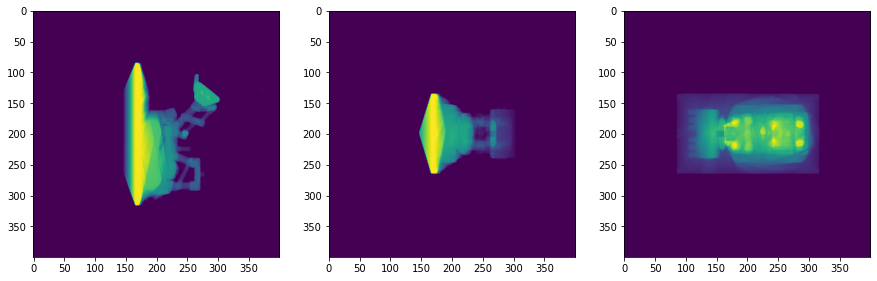

In [3]:
import numpy as np
import matplotlib.pyplot as plt

voxel = np.load("data/voxel_dil7/lego/voxel.npy")
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(np.sum(voxel, axis=0))
plt.subplot(1,3,2); plt.imshow(np.sum(voxel, axis=1))
plt.subplot(1,3,3); plt.imshow(np.sum(voxel, axis=2))
plt.show()

## (2) Train VaxNeRF

Google Colab only offers 12GB of RAM😢... so we can only run with a small number of samples, and training speedup will be limited.

In [4]:
# These parameters can be selected automatically (with the same command),
# but now we use the pre-computed values because the RAM is too limited (12GB).
!mkdir -p logs/lego_vax_c400
!echo "22425 0" >> logs/lego_vax_c400/len_inp.txt

In [5]:
!python train.py --config configs/demo --data_dir data/nerf_synthetic/lego --voxel_dir data/voxel_dil7/lego --train_dir logs/lego_vax_c400 --num_coarse_samples 400 --render_every 1000 --max_steps 5000

I1123 21:23:17.527870 139816699676544 xla_bridge.py:231] Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
I1123 21:23:17.647686 139816699676544 xla_bridge.py:231] Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
/usr/local/lib/python3.7/dist-packages/jax/_src/lib/xla_bridge.py:400: UserWarning: jax.host_id has been renamed to jax.process_index. This alias will eventually be removed; please update your code.
  "jax.host_id has been renamed to jax.process_index. This alias "
tcmalloc: large alloc 2304000000 bytes == 0x5559e9f4a000 @  0x7f299c74c1e7 0x7f298bf2646e 0x7f298bf76c7b 0x7f298bf76d18 0x7f298c032d79 0x7f298c035e4c 0x7f298c154e7f 0x7f298c15afb5 0x7f298c15ce3d 0x7f298c15e516 0x5559cc657720 0x5559cc6572f9 0x7f298c03ce6b 0x5559cc73f611 0x5559cc6c6a2e 0x5559cc657afa 0x5559cc6c5c0d 0x5559cc6c4ced 0x5559cc657bda 0x5559cc6c5c0d 0x5559cc6c4ced 0x5559cc658271 0x5559cc699159 0x5559cc6960a4 0x5559cc656c5

In [6]:
# Use this command to run the original NeRF (for comparison)
!python train.py --config configs/demo --data_dir data/nerf_synthetic/lego --train_dir logs/lego_c64f16 --num_coarse_samples 64 --num_fine_samples 16 --render_every 1000 --max_steps 1000

I1123 21:36:42.561746 139924170655616 xla_bridge.py:231] Unable to initialize backend 'tpu_driver': NOT_FOUND: Unable to find driver in registry given worker: 
I1123 21:36:42.686917 139924170655616 xla_bridge.py:231] Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
/usr/local/lib/python3.7/dist-packages/jax/_src/lib/xla_bridge.py:400: UserWarning: jax.host_id has been renamed to jax.process_index. This alias will eventually be removed; please update your code.
  "jax.host_id has been renamed to jax.process_index. This alias "
tcmalloc: large alloc 2304000000 bytes == 0x559b9139c000 @  0x7f42a239c1e7 0x7f4291b7646e 0x7f4291bc6c7b 0x7f4291bc6d18 0x7f4291c82d79 0x7f4291c85e4c 0x7f4291da4e7f 0x7f4291daafb5 0x7f4291dace3d 0x7f4291dae516 0x559b72768720 0x559b727682f9 0x7f4291c8ce6b 0x559b72850611 0x559b727d7a2e 0x559b72768afa 0x559b727d6c0d 0x559b727d5ced 0x559b72768bda 0x559b727d6c0d 0x559b727d5ced 0x559b72769271 0x559b727aa159 0x559b727a70a4 0x559b72767c5

In [7]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>